In [1]:
import math
import cmath
import numpy as np

import mido
import librosa
import librosa.display

import IPython.display as ipd
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from torch import optim

import torch.nn.functional as F
from torch import nn
import torch

In [6]:
songname = '4Beats2Mel1Inst2'

In [7]:
y, sr = librosa.load(songname + '.wav')

In [8]:
D = librosa.stft(y)

### How important is angle?

`quantize` buckets angle into `n_buckets` possible values. IMO, it starts to sound plausible around 8.

In [9]:
def quantize(D, n_buckets=32):
    nprect = np.vectorize(cmath.rect)

    mags = np.abs(D)
    buckets = np.digitize(np.angle(D), np.arange(-math.pi/2, math.pi, 2*math.pi/n_buckets))

    return nprect(mags, 2*math.pi/n_buckets * buckets)

In [10]:
#ipd.Audio(y_hat,rate=sr) # load a local WAV file
Q = 32
y_hat = librosa.istft(quantize(D,Q))

librosa.output.write_wav(songname+"-q"+str(Q)+".wav", y_hat, sr)

ipd.Audio(y_hat,rate=sr) # load a local WAV file



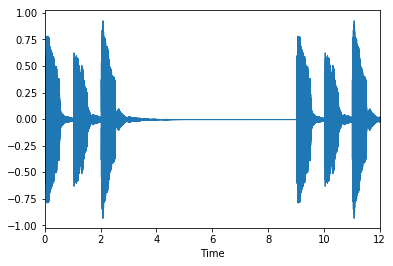

In [11]:
librosa.display.waveplot(y, sr=sr);


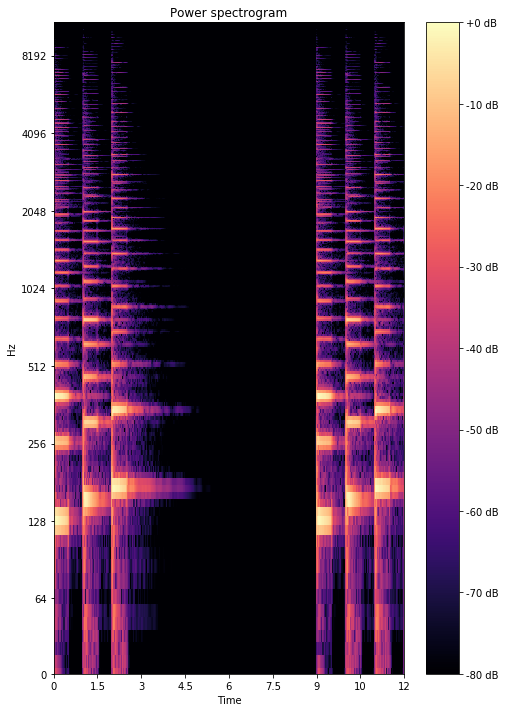

In [12]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

### Source data

Here, we convert the midi file into notes!

In [269]:
midiArray=[]
HopSize=0.023
timeTracker=0.0
totalTimeTracker=0.0
MemoryArray=np.zeros(127)
lasttime=0;
for msg in mido.MidiFile(songname + '.mid'):
    if not msg.is_meta:
        totalTimeTracker+=msg.time
        nextEventTime=lasttime+msg.time
        while nextEventTime> timeTracker + HopSize:
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize;
        if msg.type=='note_on':
            MemoryArray[msg.note]+=1.0;
        elif msg.type=='note_off':
            MemoryArray[msg.note]-=1.0;
        if(timeTracker+msg.time >= timeTracker + HopSize):
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize
        lasttime += msg.time
        

### Let's try a basic solution

This is an input layer of 127 units, one each per midi note.

Output layer of 1025 units, each one per FFT value.

In [270]:
## Solution

class Network(nn.Module):
    def __init__(self):
        super().__init__()
        # Defining the layers, 128, 64, 10 units each
        self.fc1 = nn.Linear(127, 500)
        self.fc2 = nn.Linear(500, 700)
        # Output layer, 10 units - one for each digit
        self.fc3 = nn.Linear(700, 2050)
        
    def forward(self, x):
        ''' Forward pass through the network, returns the output logits '''
        
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        x = F.relu(x)
        x = self.fc3(x)
        return x

model = Network()
model
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.train()
model.to(device)



Network(
  (fc1): Linear(in_features=127, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=700, bias=True)
  (fc3): Linear(in_features=700, out_features=2050, bias=True)
)

In [271]:
midiArray=np.float32(np.array(midiArray[10:]))
midiArray.shape
D_t=D.T
D_t.shape

(2068, 1025)

In [272]:
# D_data=D_t[:midiArray.shape[0]].real;
D_data=[]
for elem in D_t[:midiArray.shape[0]]:
    temp=np.append(np.float32(np.abs(elem)),np.float32(np.angle(elem)))
    D_data.append(temp)
D_data=np.array(D_data)
print(midiArray.shape,D_data.shape)
print(midiArray.dtype,D_data.dtype)

(1370, 127) (1370, 2050)
float32 float32


# Let's animate!

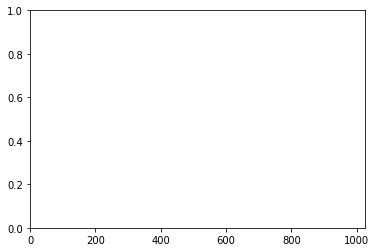

In [273]:
fig, ax = plt.subplots()
ax.set_xlim((0, 1025))
ax.set_ylim((0, 1))

line1, = ax.plot([], [], lw=1)
line2, = ax.plot([], [], lw=1)

In [274]:
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return (line1,line2,)

def animate(i):
    line1.set_data(np.linspace(0, 127, 127),
                   midiArray[i])
    line2.set_data(np.linspace(0, 1025, 1025),
                   D_data[i][:1025])
    return (line1,line2)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=midiArray.shape[0], interval=20, blit=True)
ipd.HTML(anim.to_html5_video())

# sample_num = 100

# plt.plot(D_data[sample_num][:127] / np.max(D_data[sample_num][:127]),'r')
# plt.plot(midiArray[sample_num])
# plt.show()

In [242]:
first_hot = np.where(midiArray.nonzero())
print(first_hot)

(array([0, 0, 0, ..., 1, 1, 1]), array([   0,    1,    2, ..., 1786, 1787, 1788]))


In [275]:
import torch.utils.data as utils

tensor_x = torch.stack([torch.Tensor(i) for i in midiArray]) # transform to torch tensors
tensor_y = torch.stack([torch.Tensor(i) for i in D_data])
print(tensor_x.shape,tensor_y.shape)
my_dataset = utils.TensorDataset(tensor_x,tensor_y) # create your datset
my_dataloader = utils.DataLoader(my_dataset, batch_size=16) # create your dataloader

# Optimizers require the parameters to optimize and a learning rate
optimizer = optim.SGD(model.parameters(), lr=0.01)

criterion = nn.MSELoss()
# Get our data


torch.Size([1370, 127]) torch.Size([1370, 2050])


In [276]:
epochs = 1000
LossOverEpoch=[]
for e in range(epochs):
    running_loss = 0
    for data, labels in my_dataloader:
        optimizer.zero_grad()     
        logits = model(data.to(device))
        loss = criterion(logits,labels.to(device))
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    else:
        LossOverEpoch.append(running_loss)

        print(f"Training loss: {running_loss/len(my_dataloader)}")

Training loss: 0.9636885070074133
Training loss: 0.9636129012066048
Training loss: 0.9635378988926722
Training loss: 0.9634632484934585
Training loss: 0.9633890346029698
Training loss: 0.9633152640876793
Training loss: 0.9632418146654746
Training loss: 0.9631688130909826
Training loss: 0.9630962983958239
Training loss: 0.96302418918403
Training loss: 0.9629523703824393
Training loss: 0.9628808288144619
Training loss: 0.9628096436161201
Training loss: 0.9627387343376582
Training loss: 0.9626681763688265
Training loss: 0.9625978361846349
Training loss: 0.9625277438486634
Training loss: 0.9624579435459414
Training loss: 0.9623883926122839
Training loss: 0.9623190864662066
Training loss: 0.9622500307010595
Training loss: 0.9621811675775503
Training loss: 0.9621124040473491
Training loss: 0.9620438410215578
Training loss: 0.9619754443004684
Training loss: 0.9619072091983643
Training loss: 0.9618391015798362
Training loss: 0.9617711363006979
Training loss: 0.9617032233400942
Training loss: 0

Training loss: 0.9326310022625812
Training loss: 0.9324519069280562
Training loss: 0.9322746877645164
Training loss: 0.9320992847449731
Training loss: 0.9319257671771528
Training loss: 0.9317541388080044
Training loss: 0.9315844133366332
Training loss: 0.9314165465143878
Training loss: 0.9312506364225301
Training loss: 0.9310865915748615
Training loss: 0.9309244356551316
Training loss: 0.9307641363594421
Training loss: 0.9306057609271171
Training loss: 0.9304492348090334
Training loss: 0.9302945710437069
Training loss: 0.9301417996392174
Training loss: 0.9299908345781787
Training loss: 0.9298416944220662
Training loss: 0.929694390964023
Training loss: 0.9295488462436857
Training loss: 0.9294050838365111
Training loss: 0.9292631247297449
Training loss: 0.9291228420577596
Training loss: 0.9289843138134064
Training loss: 0.928847472335017
Training loss: 0.9287122738720892
Training loss: 0.9285786647327937
Training loss: 0.9284466831121854
Training loss: 0.9283162435993205
Training loss: 0

Training loss: 0.9121757837548462
Training loss: 0.9121062534422678
Training loss: 0.9120367234843502
Training loss: 0.9119668487340299
Training loss: 0.9118967394041287
Training loss: 0.9118262945111234
Training loss: 0.9117556505370885
Training loss: 0.9116846393728846
Training loss: 0.9116134465682905
Training loss: 0.911541850227581
Training loss: 0.9114700212024239
Training loss: 0.9113979263496477
Training loss: 0.9113255109784172
Training loss: 0.9112528326303893
Training loss: 0.9111799973057756
Training loss: 0.9111069506575722
Training loss: 0.9110336185454629
Training loss: 0.9109600156513151
Training loss: 0.9108862360387088
Training loss: 0.9108120220209753
Training loss: 0.9107375634985782
Training loss: 0.9106627826654721
Training loss: 0.9105877782987041
Training loss: 0.910512528799171
Training loss: 0.9104369105256791
Training loss: 0.9103611360715572
Training loss: 0.910284845948999
Training loss: 0.9102083718848176
Training loss: 0.9101315078807475
Training loss: 0.

Training loss: 0.8948216428276324
Training loss: 0.8947888648071121
Training loss: 0.8947564181932627
Training loss: 0.8947242191007231
Training loss: 0.8946924906144146
Training loss: 0.8946609729772358
Training loss: 0.8946296576285995
Training loss: 0.8945987499549141
Training loss: 0.8945680686569134
Training loss: 0.8945377932253651
Training loss: 0.8945076840991956
Training loss: 0.8944777632551809
Training loss: 0.8944483661900957
Training loss: 0.8944189669774185
Training loss: 0.8943899588741979
Training loss: 0.8943612434499258
Training loss: 0.8943327354209032
Training loss: 0.8943043909364564
Training loss: 0.8942764850169539
Training loss: 0.8942485620283933
Training loss: 0.8942211352432211
Training loss: 0.8941938104026756
Training loss: 0.894166710053511
Training loss: 0.8941398485093973
Training loss: 0.8941132214534919
Training loss: 0.8940867339836185
Training loss: 0.8940605626517344
Training loss: 0.8940345434076694
Training loss: 0.8940087521318779
Training loss: 

Training loss: 0.8896755886664831
Training loss: 0.8896530300533118
Training loss: 0.8896304698665031
Training loss: 0.889607816035751
Training loss: 0.8895851178622675
Training loss: 0.889562318728273
Training loss: 0.8895395824869792
Training loss: 0.8895165846442132
Training loss: 0.889493859900963
Training loss: 0.889470738560492
Training loss: 0.8894478452106299
Training loss: 0.8894246822807851
Training loss: 0.8894015595568668
Training loss: 0.8893783680003591
Training loss: 0.8893551274011897
Training loss: 0.8893317750663237
Training loss: 0.8893084781099555
Training loss: 0.8892851083364803
Training loss: 0.889261642791098
Training loss: 0.8892380806927428
Training loss: 0.8892145962576209
Training loss: 0.8891908570644879
Training loss: 0.8891673308667228
Training loss: 0.8891435651782749
Training loss: 0.889119888709988
Training loss: 0.8890959935907145
Training loss: 0.889072241466682
Training loss: 0.8890482774105866
Training loss: 0.8890243111121425
Training loss: 0.8890

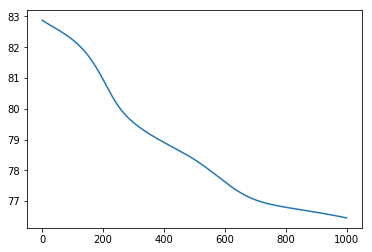

In [277]:
plt.plot(LossOverEpoch)
plt.show()

In [278]:
model.eval()


# dataiter = iter() # create your dataloader)
outputArray=[]
# Convert 2D image to 1D vector


# Calculate the class probabilities (softmax) for img

for data, labels in utils.DataLoader(my_dataset, batch_size=1):
    with torch.no_grad():
        output = model.forward(data.to(device))
        outputArray.append(output[0].cpu().numpy())

outputArray = np.array([[cmath.rect(a, b) for [a,b] in zip(col[:1025], col[1025:])] for col in outputArray]).T
# outputArray=np.array(outputArray).T

In [279]:
print((outputArray).shape)
Y_infered = librosa.istft(outputArray) 

(1025, 1370)


In [280]:
ipd.Audio(Y_infered,rate=sr)

## Ok, let's try a more complex song

In [13]:
songname = 'sets/set2'

In [15]:
y, sr = librosa.load(songname + '.m4a')

In [16]:
D = librosa.stft(y)

### How important is angle?

`quantize` buckets angle into `n_buckets` possible values. IMO, it starts to sound plausible around 8.

In [17]:
#ipd.Audio(y_hat,rate=sr) # load a local WAV file
ipd.Audio(librosa.istft(quantize(D,1)),rate=sr) # load a local WAV file

In [287]:
#ipd.Audio(y_hat,rate=sr) # load a local WAV file
ipd.Audio(librosa.istft(quantize(D,4)),rate=sr) # load a local WAV file

In [288]:
#ipd.Audio(y_hat,rate=sr) # load a local WAV file
ipd.Audio(librosa.istft(quantize(D,8)),rate=sr) # load a local WAV file

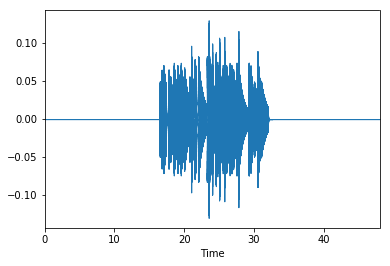

In [332]:
librosa.display.waveplot(y, sr=sr);


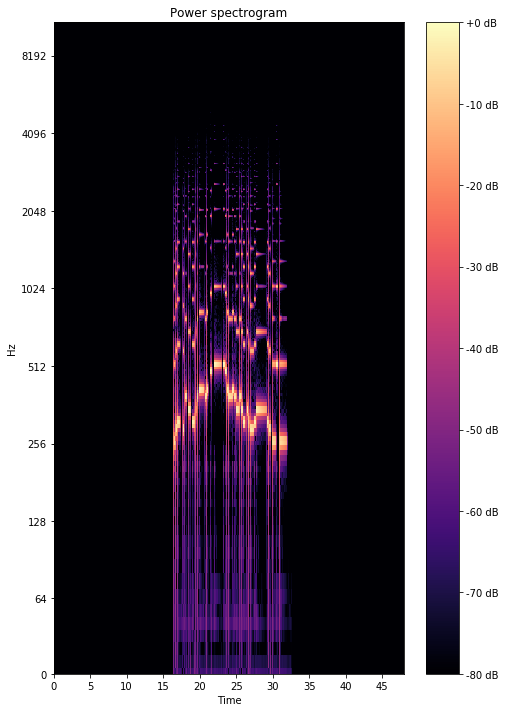

In [18]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

### Source data

Here, we convert the midi file into notes!

In [19]:
midiArray=[]
HopSize=0.023
timeTracker=0.0
totalTimeTracker=0.0
MemoryArray=np.zeros(127)
lasttime=0;
for msg in mido.MidiFile(songname + '.mid'):
    if not msg.is_meta:
        totalTimeTracker+=msg.time
        nextEventTime=lasttime+msg.time
        while nextEventTime> timeTracker + HopSize:
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize;
        if msg.type=='note_on':
            MemoryArray[msg.note]+=1.0;
        elif msg.type=='note_off':
            MemoryArray[msg.note]-=1.0;
        if(timeTracker+msg.time >= timeTracker + HopSize):
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize
        lasttime += msg.time
        

### Let's try a more complex solution

This is an input layer of `sampleHistory` * 127 units, `sampleHistory` per each per midi note -- from the last `sampleHistory` samples.

Output layer of 2050 units still, each one per FFT value.

In [20]:
sampleHistory = 100

class Network(nn.Module):
    def __init__(self, sampleHistory=10):
        super().__init__()
        # Defining the layers
        self.fc1 = nn.Linear(127 * sampleHistory, 500)
        self.fc2 = nn.Linear(500, 700)
#         self.fc3 = nn.Linear(700, 700)
        # Output layer
        self.output = nn.Linear(700, 2050)
        
    def forward(self, x):
        ''' Forward pass through the network, returns the output logits '''
        
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        x = F.relu(x)
#         x = self.fc3(x)
#         x = F.relu(x)
        x = self.output(x)
        return x

model = Network(sampleHistory)
model
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.train()
model.to(device)




Network(
  (fc1): Linear(in_features=12700, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=700, bias=True)
  (output): Linear(in_features=700, out_features=2050, bias=True)
)

In [21]:
midiArray=np.float32(np.array(midiArray[10:]))
midiArray.shape
D_t=D.T
D_t.shape

(2068, 1025)

In [22]:
midi_data = []
for i, elem in enumerate(midiArray[:D_t.shape[0]]):
    temp = np.append(np.zeros(127 * max(sampleHistory-i, 0)), midiArray[max(i-sampleHistory, 0):i])
    midi_data.append(temp)
midi_data = np.array(midi_data, dtype=np.float32)

# D_data=D_t[:midiArray.shape[0]].real;
D_data=[]
for elem in D_t[:midiArray.shape[0]]:
    temp=np.append(np.float32(np.abs(elem)),np.float32(np.angle(elem)))
    D_data.append(temp)
D_data=np.array(D_data)
print(midi_data.shape,D_data.shape)
print(midi_data.dtype,D_data.dtype)

(1382, 12700) (1382, 2050)
float32 float32


# Let's animate!

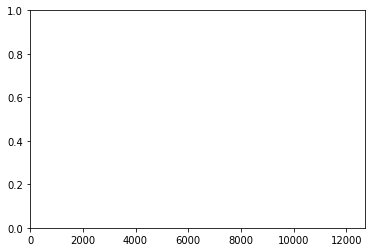

In [23]:
fig, ax = plt.subplots()
ax.set_xlim((0, 127*sampleHistory))
ax.set_ylim((0, 1))

line1, = ax.plot([], [], lw=1)
line2, = ax.plot([], [], lw=1)

In [24]:
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return (line1,line2,)

def animate(i):
    line1.set_data(np.linspace(0, 127*sampleHistory, 127*sampleHistory),
                   midi_data[i][:127*sampleHistory])
    line2.set_data(np.linspace(0, 1025, 1025),
                   D_data[i][:1025] / 100)
    return (line1,line2)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=midiArray.shape[0], interval=20, blit=True)
ipd.HTML(anim.to_html5_video())

# sample_num = 100

# plt.plot(D_data[sample_num][:127] / np.max(D_data[sample_num][:127]),'r')
# plt.plot(midiArray[sample_num])
# plt.show()

In [29]:
import torch.utils.data as utils

tensor_x = torch.stack([torch.Tensor(i) for i in midi_data]) # transform to torch tensors
tensor_y = torch.stack([torch.Tensor(i) for i in D_data])
print(tensor_x.shape,tensor_y.shape)
my_dataset = utils.TensorDataset(tensor_x.to(device),tensor_y.to(device)) # create your datset
my_dataloader = utils.DataLoader(my_dataset, batch_size=16) # create your dataloader

# Optimizers require the parameters to optimize and a learning rate
optimizer = optim.SGD(model.parameters(), lr=0.02)

criterion = nn.MSELoss()
# Get our data


torch.Size([1382, 12700]) torch.Size([1382, 2050])


In [30]:
epochs = 1000
LossOverEpoch=[]
for e in range(epochs):
    running_loss = 0
    for data, labels in my_dataloader:
        optimizer.zero_grad()     
        logits = model(data)
        loss = criterion(logits,labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    else:
        LossOverEpoch.append(running_loss)

        print(f"Training loss: {running_loss/len(my_dataloader)}")

Training loss: 0.9313669740122037
Training loss: 0.9313001647208893
Training loss: 0.9312338061616007
Training loss: 0.9311679440273518
Training loss: 0.9311024823283574
Training loss: 0.9310373009547817
Training loss: 0.9309724138068817
Training loss: 0.9309078429761375
Training loss: 0.9308436390309562
Training loss: 0.9307797806178241
Training loss: 0.9307162734845803
Training loss: 0.9306531049760765
Training loss: 0.930590144378647
Training loss: 0.930527411853552
Training loss: 0.9304649042716282
Training loss: 0.9304025767902288
Training loss: 0.9303404444737639
Training loss: 0.9302784901295639
Training loss: 0.9302167085671113
Training loss: 0.9301550579846076
Training loss: 0.9300935527633597
Training loss: 0.9300321323928241
Training loss: 0.9299707172335469
Training loss: 0.9299093326828014
Training loss: 0.9298480071887459
Training loss: 0.9297866662883938
Training loss: 0.9297253548959805
Training loss: 0.9296640171080657
Training loss: 0.9296026735060752
Training loss: 0

Training loss: 0.8982404923901476
Training loss: 0.8980558836971806
Training loss: 0.8978691251597892
Training loss: 0.8976802409669363
Training loss: 0.8974891774364394
Training loss: 0.8972958721228522
Training loss: 0.897100181524888
Training loss: 0.8969020978467346
Training loss: 0.896701754116314
Training loss: 0.8964991208966072
Training loss: 0.8962941803519839
Training loss: 0.896087015916101
Training loss: 0.8958774558067771
Training loss: 0.8956655363683407
Training loss: 0.8954511826667914
Training loss: 0.8952345060955348
Training loss: 0.8950154867997372
Training loss: 0.8947940583731551
Training loss: 0.8945702437884121
Training loss: 0.8943440107155013
Training loss: 0.8941153724418268
Training loss: 0.8938843661239477
Training loss: 0.8936508549310417
Training loss: 0.8934149577351951
Training loss: 0.8931767873267975
Training loss: 0.8929363185347154
Training loss: 0.8926935209437734
Training loss: 0.8924484712074393
Training loss: 0.8922012502209808
Training loss: 0.

Training loss: 0.8439172135522836
Training loss: 0.8437895776948827
Training loss: 0.8436624374663478
Training loss: 0.8435358807421824
Training loss: 0.8434097608163332
Training loss: 0.8432841775289887
Training loss: 0.8431589668054648
Training loss: 0.8430342712505164
Training loss: 0.842909936637259
Training loss: 0.8427860167348522
Training loss: 0.8426625347982599
Training loss: 0.8425393982679348
Training loss: 0.8424167459905576
Training loss: 0.8422944161615431
Training loss: 0.842172459792212
Training loss: 0.842050796566697
Training loss: 0.8419294763636112
Training loss: 0.8418085770012447
Training loss: 0.8416879473430715
Training loss: 0.8415677249612254
Training loss: 0.8414477816396179
Training loss: 0.8413281585049719
Training loss: 0.8412088388965154
Training loss: 0.8410898157349926
Training loss: 0.8409711186621531
Training loss: 0.8408527360357955
Training loss: 0.8407346580395657
Training loss: 0.840616841389712
Training loss: 0.8404992640864147
Training loss: 0.8

Training loss: 0.8184856792260229
Training loss: 0.8184053512118173
Training loss: 0.8183252091931672
Training loss: 0.8182452404781261
Training loss: 0.8181654272093197
Training loss: 0.8180858622005359
Training loss: 0.8180064123546057
Training loss: 0.8179270958821637
Training loss: 0.8178479690265296
Training loss: 0.817769043036501
Training loss: 0.8176902543432909
Training loss: 0.8176116307313559
Training loss: 0.8175331675996148
Training loss: 0.8174548142789676
Training loss: 0.8173766877226553
Training loss: 0.8172986388411212
Training loss: 0.8172207752967938
Training loss: 0.8171430526046355
Training loss: 0.8170655010490218
Training loss: 0.8169880804556272
Training loss: 0.8169108580275379
Training loss: 0.8168337233270915
Training loss: 0.8167568120236331
Training loss: 0.8166799874596254
Training loss: 0.8166033196558737
Training loss: 0.8165268157595426
Training loss: 0.8164503875452137
Training loss: 0.8163741543981375
Training loss: 0.8162979917860343
Training loss: 

Training loss: 0.802201095814937
Training loss: 0.8021459855285109
Training loss: 0.802090967560773
Training loss: 0.8020360729333961
Training loss: 0.8019812841178453
Training loss: 0.8019265896221222
Training loss: 0.8018719567408806
Training loss: 0.8018175111404465
Training loss: 0.801763095782572
Training loss: 0.8017088110523898
Training loss: 0.8016546414131379
Training loss: 0.8016005600270703
Training loss: 0.8015465203825861
Training loss: 0.801492676159284
Training loss: 0.8014388959751138
Training loss: 0.8013852264942205
Training loss: 0.801331669456478
Training loss: 0.8012782574123463
Training loss: 0.8012248862018921
Training loss: 0.8011716772489726
Training loss: 0.8011185351639435
Training loss: 0.8010654872666038
Training loss: 0.8010125651068439
Training loss: 0.8009596864007756
Training loss: 0.8009069783960324
Training loss: 0.8008543082503549
Training loss: 0.800801750224006
Training loss: 0.8007492867148557
Training loss: 0.8006968978168871
Training loss: 0.800

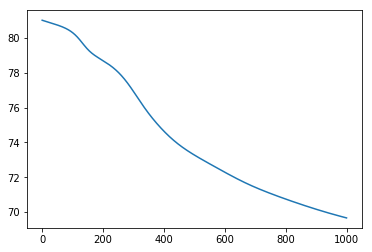

In [31]:
plt.plot(LossOverEpoch)
plt.show()

In [32]:
model.eval()


# dataiter = iter() # create your dataloader)
outputArray=[]
# Convert 2D image to 1D vector


# Calculate the class probabilities (softmax) for img

for data, labels in utils.DataLoader(my_dataset, batch_size=1):
    with torch.no_grad():
        output = model.forward(data.to(device))
        outputArray.append(output[0].cpu().numpy())

outputArray = np.array([[cmath.rect(a, b) for [a,b] in zip(col[:1025], col[1025:])] for col in outputArray]).T
# outputArray=np.array(outputArray).T

In [33]:
print((outputArray).shape)
Y_infered = librosa.istft(outputArray) 

(1025, 1382)


In [34]:
librosa.output.write_wav(songname+"-reconstructed-100b.wav", Y_infered, sr)
ipd.Audio(Y_infered,rate=sr)

Let's try playing back another midi file.

In [35]:
midiArray=[]
HopSize=0.023
timeTracker=0.0
totalTimeTracker=0.0
MemoryArray=np.zeros(127)
lasttime=0;
for msg in mido.MidiFile('4Beats2.mid'):
    if not msg.is_meta:
        totalTimeTracker+=msg.time
        nextEventTime=lasttime+msg.time
        while nextEventTime> timeTracker + HopSize:
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize;
        if msg.type=='note_on':
            MemoryArray[msg.note]+=1.0;
        elif msg.type=='note_off':
            MemoryArray[msg.note]-=1.0;
        if(timeTracker+msg.time >= timeTracker + HopSize):
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize
        lasttime += msg.time
        

In [36]:
midi_data = []
for i, elem in enumerate(midiArray):
    temp = np.append(np.zeros(127 * max(sampleHistory-i, 0)), midiArray[max(i-sampleHistory, 0):i])
    midi_data.append(temp)
midi_data = np.array(midi_data, dtype=np.float32)

In [37]:
tensor_x = torch.stack([torch.Tensor(i) for i in midi_data]) # transform to torch tensors
my_dataset = utils.TensorDataset(tensor_x) # create your datset
my_dataloader = utils.DataLoader(my_dataset, batch_size=16) # create your dataloader

In [38]:
model.eval()


# dataiter = iter() # create your dataloader)
outputArray=[]
# Convert 2D image to 1D vector


# Calculate the class probabilities (softmax) for img

for data, in utils.DataLoader(my_dataset, batch_size=1):
    with torch.no_grad():
        output = model.forward(data.to(device))
        outputArray.append(output[0].cpu().numpy())

outputArray = np.array([[cmath.rect(a, b) for [a,b] in zip(col[:1025], col[1025:])] for col in outputArray]).T
# outputArray=np.array(outputArray).T

In [39]:
print((outputArray).shape)
Y_infered = librosa.istft(outputArray) 

(1025, 501)


In [40]:
librosa.output.write_wav("4Beats2-reconstructed-from-set2-100.wav", Y_infered, sr)
ipd.Audio(Y_infered,rate=sr)

# Further Experiments

In [240]:
## Solution

class Network_recursive(nn.Module):
    def __init__(self):
        super().__init__()
        # Defining the layers, 128, 64, 10 units each
        self.fc1 = nn.Linear(127 + 1025*2, 500)
        self.fc2 = nn.Linear(500, 700)
        # Output layer, 10 units - one for each digit
        self.fc3 = nn.Linear(700, 1025*2)
        
    def forward(self, x):
        ''' Forward pass through the network, returns the output logits '''
        
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        x = F.relu(x)
        x = self.fc3(x)
        return x

model = Network_recursive()
model
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.train()
model.to(device)



Network_recursive(
  (fc1): Linear(in_features=2177, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=700, bias=True)
  (fc3): Linear(in_features=700, out_features=2050, bias=True)
)

In [241]:
midiArray=np.float32(np.array(midiArray))
midiArray.shape
D_t=D.T
D_t.shape

(517, 1025)

In [242]:
a = []
a.append(np.append([3], [4]))
a

[array([3, 4])]

In [243]:
# D_data=D_t[:midiArray.shape[0]].real;
D_data=np.array([np.append(np.float32(np.abs(elem)), np.float32(np.angle(elem))) for elem in D_t[:midiArray.shape[0]]])
print(midiArray.shape,D_data.shape)
print(midiArray.dtype,D_data.dtype)

(501, 127) (501, 2050)
float32 float32


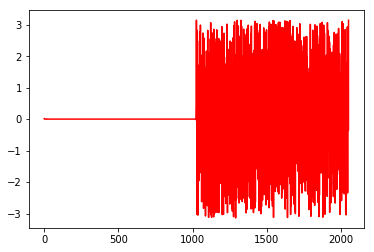

In [244]:
plt.plot(D_data[250],'r')
plt.show()

In [245]:
D_data

array([[ 4.51444656e-01,  1.16496943e-01,  2.07029730e-02, ...,
         7.07239822e-13,  1.65553769e-11,  3.14159250e+00],
       [ 1.28359926e+00,  8.62858891e-01,  4.78261769e-01, ...,
         2.87729144e+00, -5.31834245e-01,  3.14159250e+00],
       [ 3.51532602e+00,  2.38617444e+00,  8.16105723e-01, ...,
        -2.96446830e-01, -2.69000030e+00,  0.00000000e+00],
       ...,
       [ 1.92262896e-03,  1.05965234e-01,  6.47517592e-02, ...,
        -1.78113043e+00,  1.96310058e-01,  3.14159250e+00],
       [ 9.69093665e-03,  4.90058921e-02,  5.62928244e-02, ...,
         1.09661615e+00, -1.94460654e+00,  0.00000000e+00],
       [ 2.95841359e-02,  2.05535777e-02,  1.08570354e-02, ...,
        -2.32976794e+00,  2.51119113e+00,  0.00000000e+00]], dtype=float32)

In [246]:
midiPlus = np.array([np.append(*col) for col in zip(midiArray[1:], D_data[:-1])])

In [247]:
midiPlus

array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         7.0723982e-13,  1.6555377e-11,  3.1415925e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         2.8772914e+00, -5.3183424e-01,  3.1415925e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -2.9644683e-01, -2.6900003e+00,  0.0000000e+00],
       ...,
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         1.5862756e+00, -5.6272554e-01,  3.1415925e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -1.7811304e+00,  1.9631006e-01,  3.1415925e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         1.0966161e+00, -1.9446065e+00,  0.0000000e+00]], dtype=float32)

In [254]:
import torch.utils.data as utils

tensor_x = torch.stack([torch.Tensor(i) for i in midiPlus]) # transform to torch tensors
tensor_y = torch.stack([torch.Tensor(i) for i in D_data[1:]])
print(tensor_x.shape,tensor_y.shape)
my_dataset = utils.TensorDataset(tensor_x,tensor_y) # create your datset
my_dataloader = utils.DataLoader(my_dataset, batch_size=16) # create your dataloader

# Optimizers require the parameters to optimize and a learning rate
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum = 0.5)

criterion = nn.MSELoss()
# Get our data


torch.Size([500, 2177]) torch.Size([500, 2050])


In [258]:
epochs = 1000
LossOverEpoch=[]
for e in range(epochs):
    last_output = None
    running_loss = 0
    for data, labels in my_dataloader:
        data = torch.from_numpy(np.array([np.append(data[0][:127], (last_output[0].cpu() if last_output is not None else np.zeros(2050, dtype=np.float32)))]))
        optimizer.zero_grad()     
        logits = model(data.to(device))
        loss = criterion(logits,labels.to(device))
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        last_output = logits.detach()
    else:
        LossOverEpoch.append(running_loss)

        print(f"Training loss: {running_loss/len(my_dataloader)}")

Training loss: 6.6909974198788404
Training loss: 6.6899938229471445
Training loss: 6.689026368781924
Training loss: 6.688094301149249
Training loss: 6.687197521328926
Training loss: 6.686333633959293
Training loss: 6.685504537075758
Training loss: 6.684702776372433
Training loss: 6.683931943029165
Training loss: 6.683182664215565
Training loss: 6.682467522099614
Training loss: 6.681784125044942
Training loss: 6.6811303328722715
Training loss: 6.680472696200013
Training loss: 6.6889017801731825
Training loss: 6.683007026091218
Training loss: 6.678781922906637
Training loss: 6.678233370184898
Training loss: 6.654006065800786
Training loss: 6.64025441557169
Training loss: 6.632810685783625
Training loss: 6.630633870139718
Training loss: 6.628667728975415
Training loss: 6.645185684785247
Training loss: 6.631188625469804
Training loss: 6.674295790493488
Training loss: 6.6739392932504416
Training loss: 6.6736015528440475
Training loss: 6.673281125724316
Training loss: 6.672974796965718
Train

Training loss: 6.666722996160388
Training loss: 6.6667226534336805
Training loss: 6.666722411289811
Training loss: 6.666722260415554
Training loss: 6.666722306981683
Training loss: 6.666722068563104
Training loss: 6.666721995919943
Training loss: 6.666721930727363
Training loss: 6.666721669957042
Training loss: 6.6667218171060085
Training loss: 6.666721571236849
Training loss: 6.666721329092979
Training loss: 6.666721187531948
Training loss: 6.666721234098077
Training loss: 6.666720937937498
Training loss: 6.666720923036337
Training loss: 6.6667206808924675
Training loss: 6.666720576584339
Training loss: 6.666720721870661
Training loss: 6.666720362380147
Training loss: 6.666720470413566
Training loss: 6.666720246896148
Training loss: 6.666720245033503
Training loss: 6.666720138862729
Training loss: 6.66671990044415
Training loss: 6.666719922795892
Training loss: 6.666719891130924
Training loss: 6.666719665750861
Training loss: 6.666719408705831
Training loss: 6.666719540953636
Training

Training loss: 6.666700756177306
Training loss: 6.6667007394135
Training loss: 6.666700642555952
Training loss: 6.66670067794621
Training loss: 6.666700499132276
Training loss: 6.666700571775436
Training loss: 6.666700406000018
Training loss: 6.666700292378664
Training loss: 6.66670024767518
Training loss: 6.666700329631567
Training loss: 6.666700102388859
Training loss: 6.666700050234795
Training loss: 6.666700197383761
Training loss: 6.666699822992086
Training loss: 6.666699754074216
Training loss: 6.666699653491378
Training loss: 6.666699625551701
Training loss: 6.666699573397636
Training loss: 6.6666995622217655
Training loss: 6.666699366644025
Training loss: 6.6666993498802185
Training loss: 6.6666992250829935
Training loss: 6.666699267923832
Training loss: 6.666699066758156
Training loss: 6.666699120774865
Training loss: 6.666699029505253
Training loss: 6.666699010878801
Training loss: 6.666698867455125
Training loss: 6.666698798537254
Training loss: 6.666698785498738
Training lo

Training loss: 6.666681686416268
Training loss: 6.666681652888656
Training loss: 6.666681531816721
Training loss: 6.666681431233883
Training loss: 6.6666814014315605
Training loss: 6.66668139025569
Training loss: 6.666681192815304
Training loss: 6.6666810773313046
Training loss: 6.666681040078402
Training loss: 6.66668102145195
Training loss: 6.666680945083499
Training loss: 6.666680943220854
Training loss: 6.666680887341499
Training loss: 6.6666808649897575
Training loss: 6.666680609807372
Training loss: 6.666680626571178
Training loss: 6.666680509224534
Training loss: 6.666680408641696
Training loss: 6.666680242866278
Training loss: 6.666680131107569
Training loss: 6.66668001934886
Training loss: 6.666680034250021
Training loss: 6.666680032387376
Training loss: 6.666679916903377
Training loss: 6.66667990013957
Training loss: 6.6666797660291195
Training loss: 6.666679587215185
Training loss: 6.666679542511702
Training loss: 6.666679449379444
Training loss: 6.66667945496738
Training lo

Training loss: 6.6666630413383245
Training loss: 6.666663018986583
Training loss: 6.666662776842713
Training loss: 6.666662838310003


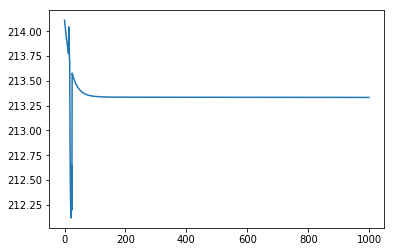

In [259]:
plt.plot(LossOverEpoch)
plt.show()

In [260]:
model.eval()


# dataiter = iter() # create your dataloader)
outputArray=[]
# Convert 2D image to 1D vector


# Calculate the class probabilities (softmax) for img

output = None

for data, labels in utils.DataLoader(my_dataset, batch_size=1):
#     print(data.shape)
#     print(output.shape if output is not None else "?")
    data = torch.from_numpy(np.array([np.append(data[0][:127], (output[0].cpu() if output is not None else np.zeros(2050, dtype=np.float32)))]))
#     print(data.shape)
    with torch.no_grad():
        output = model.forward(data.to(device))
        outputArray.append(output[0].cpu().numpy())

outputArray = np.array([[cmath.rect(a, b) for [a,b] in zip(col[:-1:2], col[1::2])] for col in outputArray]).T
# outputArray=np.array(outputArray).T

In [261]:
print((outputArray).shape)
Y_infered = librosa.istft(outputArray) 

(1025, 500)


In [262]:
ipd.Audio(Y_infered,rate=sr)

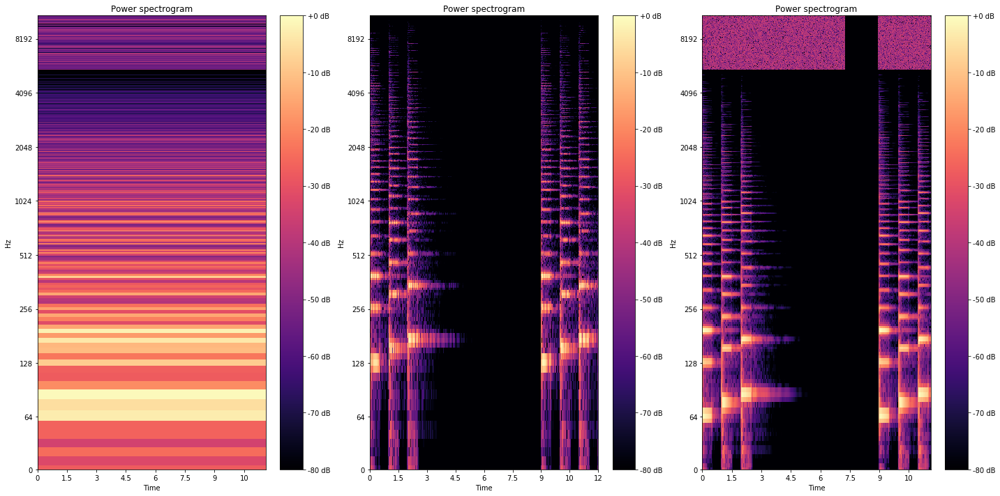

In [234]:

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
librosa.display.specshow(librosa.amplitude_to_db(outputArray,
                                                  ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

plt.subplot(1,3,2)
librosa.display.specshow(librosa.amplitude_to_db(D.real,
                                                  ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()


plt.subplot(1,3,3)
librosa.display.specshow(librosa.amplitude_to_db(tensor_y.numpy().T,
                                                  ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()


0.0784587487578392


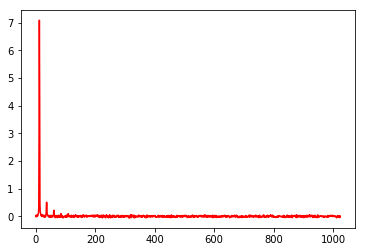

In [109]:
output=np.array(0);
with torch.no_grad():
        output = model.forward(torch.zeros([1, 127], dtype=torch.float32))
        loss = criterion(output,torch.zeros([1, 1025], dtype=torch.float32))
        print(loss.item())
plt.plot(output.numpy()[0],'r')
plt.show()

(1025,)
